<a href="https://colab.research.google.com/github/hansonnguy/MAT-421/blob/main/2D_FDTD_Simulation_of_TM_Waves_with_PEC_and_PML_Boundaries.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 2D FDTD Simulation of TM Waves with PEC and PML Boundaries

Hanson Nguyen

MAT 421

April 27, 2025

In case the images/results do not load, you can find the results at: https://github.com/hansonnguy/MAT-421/tree/47715a6b4e888e21726192874587710f35830cb8/Final%20Project%20Results

# Introduction

Electromagnetic wave propagation in complex media is fundamental to engineering applications in photonics, antenna design, and microwave devices. The Finite-Difference Time-Domain (FDTD) method, introduced by Kane Yee in 1966, aims to solve Maxwell's equations, which are coupled differential equations that fundamentally describe electromagnetic waves. The FDTD method discretizes Maxwell’s curl equations on a staggered spatial and temporal grid. In doing so, the method enables us to solve the partial differential equations numerically through central differences. Despite its simplicity and versatility, FDTD requires careful treatment of boundaries to avoid non-physical reflections. Perfect Electric Conductor (PEC) boundaries are trivial but reflect all incident energy. To simulate open-space conditions, absorbing layers such as the Perfectly Matched Layer (PML) introduced by Jean-Pierre Berenger (1994) are employed.

This paper implements two variants of the 2D TM FDTD algorithm in Python: one with PEC boundaries and one with PML. We then compare their reflection performance and illustrate field propagation via animated GIFs.

Research questions:

How do PEC and PML boundary conditions affect reflection of a point-source TM wave in a 2D domain?

In PML methods, how effective is polynomial grading PML in minimizing reflections at a specified reflection coefficient?

How can we understand the electrodymics in a dielectric slab for PEC and PML boundary conditions?

Significance: Open-boundary electromagnetic simulations are essential for accurate modeling of photonic devices and antennas. Demonstrating and comparing PEC vs PML allows us to understand and manipulate boundaries in FDTD.

# RELATED WORK

Yee (1966): Introduced the staggered grid FDTD algorithm for solving Maxwell’s equations in time domain.

Berenger (1994): Developed the PML absorbing boundary condition that is reflectionless at the interface for all angles and frequencies.

Taflove & Hagness (2005): Comprehensive textbook covering FDTD theory, stability, and boundary conditions including PML.

Gedney (1996): Detailed implementation of convolutional PML and graded PML profiles.

These works establish the foundation for our two implementations and justify the mathematical formulations employed.

# MATH METHOD
First, we must look at Maxwell's curl equations, as they describe how electromagnetic waves propagate:

\begin{equation}
\nabla\times E = -\mu\frac{\partial H}{\partial t},
\end{equation}
and
\begin{equation}
\nabla\times H = -\epsilon\frac{\partial E}{\partial t},
\end{equation}
where $\mu = \mu_r\mu_0$ and $\epsilon = \epsilon_r\epsilon_0$ are the permeability and permittivity of the media, respectively.
If we assume transverse magnetic ($\mathrm{TM}_z$) field in the z-direction, such that the there is no magnetic field in the z-direction, we can enforce $E_x = E_y = 0$, $E_z \neq 0$, $H_z = 0$, and $H_x, H_y \neq 0$. Simplifying, we obtain:
\begin{equation}
(\nabla\times E)_x = \frac{\partial E_z}{\partial y} \rightarrow \frac{\partial H_x}{\partial t} = -\frac{1}{\mu} \frac{\partial E}{\partial y},
\end{equation}
\begin{equation}
(\nabla\times E)_y = -\frac{\partial E_z}{\partial x} \rightarrow \frac{\partial H_y}{\partial t} = \frac{1}{\mu} \frac{\partial E}{\partial x},
\end{equation}
\begin{equation}
(\nabla\times H)_z = \frac{\partial H_y}{\partial x} - \frac{\partial H_x}{\partial y} \rightarrow \frac{\partial E}{\partial t} = \frac{1}{\epsilon} \frac{\partial H_x}{\partial y}
\end{equation}.

We now aim to discretize these equations. Using Yee's update equations, we obtain:

Yee’s update equations (PEC case):

\begin{equation}
H_x^{n+1/2}(i,j) = H_x^{n-1/2}(i,j) + \frac{\Delta t}{\mu\Delta}(E_z^n(i,j+1) - E_z^n(i,j)),
\end{equation}
\begin{equation}
H_y^{n+1/2}(i,j) = H_y^{n-1/2}(i,j) + \frac{\Delta t}{\mu\Delta}(E_z^n(i+1,j) - E_z^n(i,j)),
\end{equation}
\begin{equation}
E_z^{n+1}(i,j) = E_z^{n}(i,j) + \frac{\Delta t}{\epsilon\Delta}(H_y^{n+1/2}(i,j) - H_y^{n+1/2}(i-1,j) - H_x^{n+1/2}(i,j) + H_x^{n+1/2}(i,j-1)),
\end{equation}
where $i,j$ denote $x, y$ indices, $\Delta$ is the spatial step size,  $n$ denotes the time indice, and $\Delta t$ is the temporal step size.

To most accurately capture the imperfections of a media, we can include the conductivity of the media, which can result in losses. We first analyze the 2D scenerio as such:

\begin{equation}
\frac{\partial E_z}{\partial t} = \frac{1}{\epsilon}(\frac{\partial H_x}{\partial y} - \frac{\partial H_y}{\partial z}) - \frac{\sigma}{\epsilon}E_z= \frac{1}{\epsilon}S  - \frac{\sigma}{\epsilon}E_z,
\end{equation}
where we have now included the term $\frac{\sigma}{\epsilon}E_z$ for current density and where $S = \frac{\partial H_x}{\partial y} - \frac{\partial H_y}{\partial z}$ as a short hand. Thus, we can discretize this into
\begin{equation}
\frac{E_z^{n+1} - E_z^n}{\Delta t} \approx [\frac{1}{\epsilon}S]^{n+1/2} - [\frac{\sigma}{\epsilon}E_z]^{n+1/2}
\end{equation}
We approximate $S^{n+1/2} \approx S^n$ and $E_z^{n+1/2} \approx \frac{1}{2}(E_z^{n+1} + E_z^{n})$ to obtain
\begin{equation}
\frac{E_z^{n+1} - E_z^n}{\Delta t} \approx \frac{1}{\epsilon}S^n - \frac{\sigma}{2\epsilon}(E_z^{n+1} + E_z^{n})
\end{equation}
We can rearrange these terms to obtain:
\begin{equation}
E_z^{n+1}=\frac{\epsilon-\sigma\Delta t / 2}{\epsilon+\sigma\Delta t / 2}E_z^n + \frac{\Delta t / \Delta}{\epsilon+\sigma\Delta t / 2}(H_y^{n+1/2}(i,j) - H_y^{n+1/2}(i-1,j) - H_x^{n+1/2}(i,j) + H_x^{n+1/2}(i,j-1)) = A(E_z^n) + B(H_y^{n+1/2}(i,j) - H_y^{n+1/2}(i-1,j) - H_x^{n+1/2}(i,j) + H_x^{n+1/2}(i,j-1))
\end{equation}
For constants $A$ and $B$. Similarly for the magnetic field, we can obtain:
\begin{equation}
H_{x/y}^{n+1/2} = CH_{x/y}^{n+1/2} -/+ D(\partial_{x/y}E_z^n)
\end{equation}
where $C = \frac{\mu-\sigma^*\Delta t / 2}{\mu+\sigma^*\Delta t / 2}$ and $D = \frac{\Delta t / \Delta}{\mu+\sigma\Delta t / 2}$.

# Implementation

# PEC Boundary Conditions

First we establish our parameters. First we set the dimension of the entire media to be 200 by 200 pixels. We can find the physical size of the media by choose $\Delta$ to be some spatial distance. Then, the entire media is $\Delta x \times  N_x$ by $\Delta y \times  N_y$. We can then do the same for the time, obtaining a total simulation time of $\Delta t \times  N_{t}$, for $N_t$ time steps.

The Courant stability factor comes from a stability requirement for numerical simulations like FDTD. It basically says the time step $\Delta t$ must be small enough relative to the space step $\Delta$ and the speed of the wave $c$ so that the simulation doesn't become unstable.

In 2D FDTD, the Courant condition is:
\begin{equation}
\Delta t \leq S\Delta / c
\end{equation}

For larger $S$, the simulation is unstable, but for smaller $S$, the simulation is more stable, with a much longer simulation time due to the increased number of steps.



In [68]:
# Imports and parameters
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from PIL import Image
from IPython.display import Image as IPyImage, display

# Grid dimensions
xdim = 100
ydim = 100

# Total number of time steps
time_tot = 400

# Source position
xsource = xdim//2
ysource = ydim//2

# Courant stability factor
S = 1 / np.sqrt(2)

# Physical constants
epsilon0 = (1 / (36 * np.pi)) * 1e-9
mu0 = 4 * np.pi * 1e-7
c = 3e8

# Spatial and temporal steps
delta = 1e-6  # 1 μm
deltat = S * delta / c


Here, we simply establish key coefficients and material parameters. In the middle region of the media, we choose $\epsilon_r$ = 2 to reflect a dielectric slab, which is often used as a model for waveguides. Changing these material parameters is key for understanding electromagnetic behavior in different waveguide geomtries.

In [69]:
# Field arrays and material properties
Ez = np.zeros((xdim, ydim))
Hy = np.zeros((xdim, ydim))
Hx = np.zeros((xdim, ydim))

epsilon = epsilon0 * np.ones((xdim, ydim))
# Insert a dielectric slab in the middle with eps_r = 2
epsilon[int(3*xsource/4):int(5*xsource/4), :] = 2 * epsilon0
mu = mu0 * np.ones((xdim, ydim))
sigma = 4e-4 * np.ones((xdim, ydim))
sigma_star = 4e-4 * np.ones((xdim, ydim))

# Sine‐source frequency
frequency = 2e13

# Precompute update coefficients
A = (epsilon - 0.5 * deltat * sigma) / (epsilon + 0.5 * deltat * sigma)
B = (deltat / delta) / (epsilon + 0.5 * deltat * sigma)
C = (mu - 0.5 * deltat * sigma_star) / (mu + 0.5 * deltat * sigma_star)
D = (deltat / delta) / (mu + 0.5 * deltat * sigma_star)

# For GIF creation
frames = []
extent = [0, delta * xdim * 1e6, 0, delta * ydim * 1e6]


For PEC boundary conditions, we simply set $E_x^{n+1}(1,j) = E_z^{n+1}({N_x},j) = E_z^{n+1}(i,1) = E_z^{n+1}(i,{N_y}) = 0$, which ensures that we have a full reflection of the electric field at the boundaries.

In [70]:
# Time‐loop, update fields, capture frames
for n in range(1, time_tot + 1):

    # define update window
    n1  = max(xsource - n - 1, 0)
    n2  = min(xsource + n,     xdim - 2)
    n11 = max(ysource - n - 1, 0)
    n21 = min(ysource + n,     ydim - 2)

    # H‐field updates
    Hy[n1:n2+1, n11:n21+1] = (
        C[n1:n2+1, n11:n21+1]*Hy[n1:n2+1, n11:n21+1]
        +D[n1:n2+1, n11:n21+1]*(Ez[n1+1:n2+2, n11:n21+1] - Ez[n1:n2+1, n11:n21+1])
    )
    Hx[n1:n2+1, n11:n21+1] = (
        C[n1:n2+1, n11:n21+1]*Hx[n1:n2+1, n11:n21+1]
        - D[n1:n2+1, n11:n21+1]*(Ez[n1:n2+1, n11+1:n21+2] - Ez[n1:n2+1, n11:n21+1])
    )

    # E‐field update
    Ez[n1+1:n2+2, n11+1:n21+2] = (
        A[n1+1:n2+2, n11+1:n21+2]*Ez[n1+1:n2+2, n11+1:n21+2]
        + B[n1+1:n2+2, n11+1:n21+2]*(
            Hy[n1+1:n2+2, n11+1:n21+2] - Hy[n1:n2+1, n11+1:n21+2]
            - Hx[n1+1:n2+2, n11+1:n21+2] + Hx[n1+1:n2+2, n11:n21+1]
        )
    )

    # PEC boundaries
    Ez[:,  [0, -1]] = 0
    Ez[[0, -1], :] = 0

    # Source injection

    tstart = 1
    Ez[xsource, ysource] = np.sin(2*np.pi*frequency*(n-tstart)*deltat)


    # Plot & capture
    fig, ax = plt.subplots(figsize=(5,5))
    im = ax.imshow(Ez.T, cmap='jet', vmin=-1, vmax=1,
                   origin='lower', extent=extent)
    ax.set_title(f'Ez at step {n}')
    ax.set_xlabel('x (μm)');  ax.set_ylabel('y (μm)')
    fig.colorbar(im, ax=ax, label='Ez')
    fig.tight_layout()

    fig.canvas.draw()
    frame = np.array(fig.canvas.renderer.buffer_rgba())
    frames.append(Image.fromarray(frame))
    plt.close(fig)


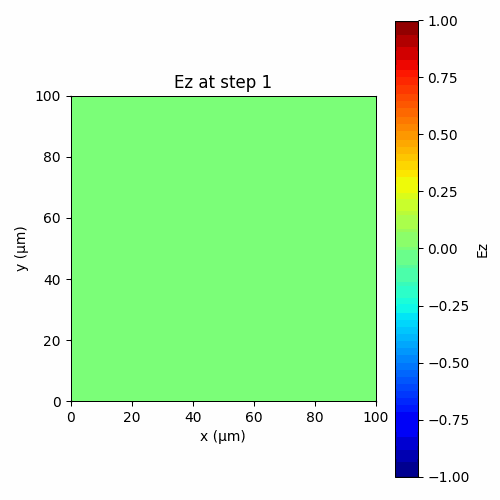

In [71]:
# Save GIF to an in-memory buffer and display inline
import io
from IPython.display import Image as IPyImage, display

# write into a BytesIO buffer
buf = io.BytesIO()
frames[0].save(
    buf,
    format='GIF',
    append_images=frames[1:],
    save_all=True,
    duration=50,
    loop=1
)
buf.seek(0)  # rewind to start

# display directly from memory
display(IPyImage(data=buf.getvalue(), format='gif'))


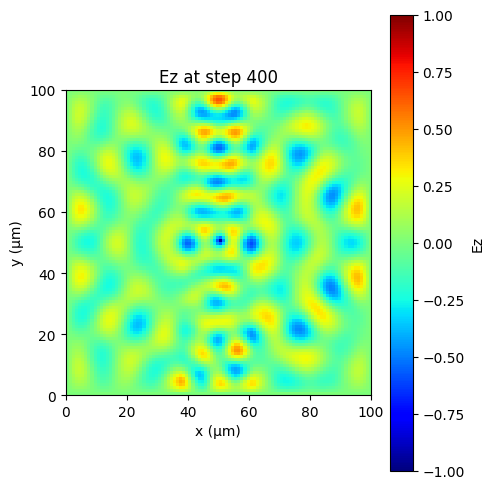

In [72]:
# Plot & capture
fig, ax = plt.subplots(figsize=(5,5))
im = ax.imshow(Ez.T, cmap='jet', vmin=-1, vmax=1,
                   origin='lower', extent=extent)
ax.set_title(f'Ez at step {n}')
ax.set_xlabel('x (μm)');  ax.set_ylabel('y (μm)')
fig.colorbar(im, ax=ax, label='Ez')
fig.tight_layout()


Here, we observed that the waves reflect off of the boundaries due to the boundary conditions we set for the media. PEC ensures that the electric field is completely reflected

# Gaussian pulse to find reflection coefficient

We can use a single pulse to find the magnitude of the incident wave and the reflected wave and calcuate the reflection coefficient through this analysis with PEC boundaries

In [73]:
# For GIF creation
frames = []
extent = [0, delta * xdim * 1e6, 0, delta * ydim * 1e6]

# Field arrays and material properties
Ez = np.zeros((xdim, ydim))
Hy = np.zeros((xdim, ydim))
Hx = np.zeros((xdim, ydim))

epsilon = epsilon0 * np.ones((xdim, ydim))
# Insert a dielectric slab in the middle with eps_r = 2
epsilon[int(3*xsource/4):int(5*xsource/4), :] = 2 * epsilon0
mu = mu0 * np.ones((xdim, ydim))
sigma = 4e-4 * np.ones((xdim, ydim))
sigma_star = 4e-4 * np.ones((xdim, ydim))

# Precompute update coefficients
A = (epsilon - 0.5 * deltat * sigma) / (epsilon + 0.5 * deltat * sigma)
B = (deltat / delta) / (epsilon + 0.5 * deltat * sigma)
C = (mu - 0.5 * deltat * sigma_star) / (mu + 0.5 * deltat * sigma_star)
D = (deltat / delta) / (mu + 0.5 * deltat * sigma_star)

probe_pos = int(xdim - 5)

E_ts  = []

# Time‐loop, update fields, capture frames
for n in range(1, time_tot + 1):

    # define update window
    n1  = max(xsource - n - 1, 0)
    n2  = min(xsource + n,     xdim - 2)
    n11 = max(ysource - n - 1, 0)
    n21 = min(ysource + n,     ydim - 2)

    # H‐field updates
    Hy[n1:n2+1, n11:n21+1] = (
        C[n1:n2+1, n11:n21+1]*Hy[n1:n2+1, n11:n21+1]
        +D[n1:n2+1, n11:n21+1]*(Ez[n1+1:n2+2, n11:n21+1] - Ez[n1:n2+1, n11:n21+1])
    )
    Hx[n1:n2+1, n11:n21+1] = (
        C[n1:n2+1, n11:n21+1]*Hx[n1:n2+1, n11:n21+1]
        - D[n1:n2+1, n11:n21+1]*(Ez[n1:n2+1, n11+1:n21+2] - Ez[n1:n2+1, n11:n21+1])
    )

    # E‐field update
    Ez[n1+1:n2+2, n11+1:n21+2] = (
        A[n1+1:n2+2, n11+1:n21+2]*Ez[n1+1:n2+2, n11+1:n21+2]
        + B[n1+1:n2+2, n11+1:n21+2]*(
            Hy[n1+1:n2+2, n11+1:n21+2] - Hy[n1:n2+1, n11+1:n21+2]
            - Hx[n1+1:n2+2, n11+1:n21+2] + Hx[n1+1:n2+2, n11:n21+1]
        )
    )

    # PEC boundaries
    Ez[:,  [0, -1]] = 0
    Ez[[0, -1], :] = 0

    # Source injection

    if n < 10:
      Ez[xsource, ysource] = 1.0
    else:
      Ez[xsource, ysource] = 0.0
    E_ts.append( Ez[probe_pos, ysource] )

First peak at index 76, time = 1.815e-13 s, amplitude = 1.242e-01


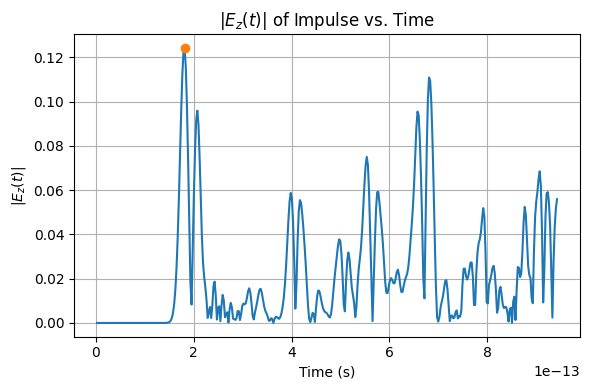

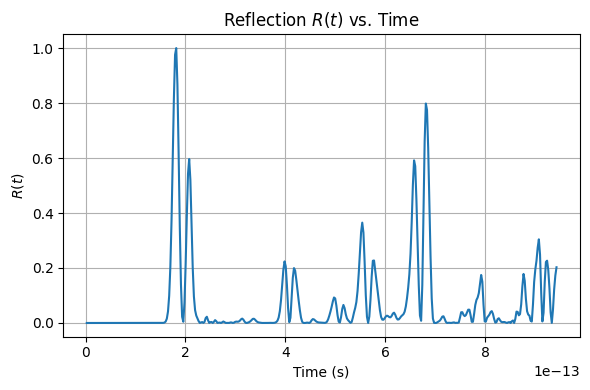

In [74]:
from scipy.signal import find_peaks

E_test  = np.array(E_ts)
t = np.arange(1, time_tot+1) * deltat

absE = np.abs(E_test)
peaks, _ = find_peaks(absE)

first_peak_idx = peaks[0]
first_peak_time  = t[first_peak_idx]
E_inc = absE[first_peak_idx]

print(f"First peak at index { first_peak_idx }, time = {first_peak_time:.3e} s, amplitude = {E_inc:.3e}")

# plot E
plt.figure(figsize=(6,4))
plt.plot(t, np.abs(E_test), lw=1.5)
plt.plot(first_peak_time, E_inc, 'o')
plt.xlabel('Time (s)')
plt.ylabel('$|E_z(t)|$')
plt.title('$|E_z(t)|$ of Impulse vs. Time')
plt.grid(True)
plt.tight_layout()
plt.show()

# plot R
R_t = (absE/E_inc)**2
plt.figure(figsize=(6,4))
plt.plot(t, R_t, lw=1.5)
plt.xlabel('Time (s)')
plt.ylabel('$R(t)$')
plt.title('Reflection $R(t)$ vs. Time')
plt.grid(True)
plt.tight_layout()
plt.show()



# PML Boundary Conditions

For PML boundary conditions, we declare a reflection coefficient, which is the amount of reflect we aim to achieve at the boundaries. Ideally, we set this to $0$. However, to mimic more realistic scenerios, where there is not a perfect impedance match, we might set this to a low value.

In [75]:
import numpy as np
import matplotlib.pyplot as plt

xdim, ydim = 100, 100
time_tot=400
bound_width=25
gradingorder=6
refl_coeff=1e-6
delta=1e-6
frequency=2e13

# Physical constants
epsilon0 = 1e-9/(36*np.pi)
mu0 = 4*np.pi*1e-7
c = 3e8

# Courant factor
S = 1/np.sqrt(2)
deltat = S * delta / c

# Source position
xsource, ysource = xdim//2, ydim//2



We want a PML of physical thickness
$
L = N_{\rm PML}\,\Delta x
$
that, for a normally-incident plane wave, reflects no more than a fraction $R$ of its amplitude. In a graded PML, one typically uses
$
\sigma(x) = \sigma_{\max}\left( \frac{x}{L} \right)^m
\qquad (0 \leq x \leq L, \quad m = \text{grading order}).
$


In a lossy dielectric with conductivity $\sigma$, a time-harmonic field decays as
$E(x) \propto \exp\left( -\alpha(x)\,x \right),
\quad
\alpha(x) \approx \frac{\sigma(x)}{2\,\varepsilon_0\,c}.
$

A wave entering the PML must traverse twice the thickness $L$. So the net amplitude reflection from the single interface is roughly
$R \approx \exp\left( -2 \underbrace{\int_0^L \alpha(x)\,dx}_{\displaystyle I} \right)
= \exp\left( -2I \right).$

$I = \int_0^L \frac{\sigma_{\max}}{2\,\varepsilon_0\,c} \left( \frac{x}{L} \right)^m dx
= \frac{\sigma_{\max}}{2\,\varepsilon_0\,c}\,\frac{1}{L^m}\int_0^L x^m\,dx
= \frac{\sigma_{\max}}{2\,\varepsilon_0\,c}\,\frac{L}{m+1}.$

Solving for $\sigma_{\max}$ we get
$R = \exp\left( -2I \right)
= \exp\left( -\frac{\sigma_{\max}\,L}{\varepsilon_0\,c\,(m+1)} \right)
\quad \Longrightarrow \quad
\sigma_{\max}
= -\ln(R)\;\frac{(m+1)\,\varepsilon_0\,c}{L}.$
Substituting $L = N_{\rm PML}\,\Delta x$
giving us

$\sigma_{max} = -\ln(R) \frac{(m+1)\,\varepsilon_0\,c} {N_{\rm PML}\,\Delta x}$.


In practice, we assign a scalar $\sigma_k$ to each of the $N_{\rm PML}$ grid cells so that the continuous profile $\sigma(x) = \sigma_{\max}(x/L)^m$ is faithfully represented:

$\int x^m\,dx = \frac{x^{m+1}}{m+1}.
$

Average over the $k$th cell centered at $x_k = (k+1/2)\Delta x$, we get
$\sigma_k
\propto
\frac{1}{\Delta x}
\int_{(k-1/2)\Delta x}^{(k+1/2)\Delta x}
\left( \frac{x}{L} \right)^m
dx
= \frac{1}{L^m(m+1)\Delta x}
\left[
(x+\tfrac{1}{2}\Delta x)^{m+1} - (x-\tfrac{1}{2}\Delta x)^{m+1}
\right].
$

so that the outermost cell ($k=N_{\rm PML}$) reaches $\sigma_{\max}$:
$\sigma_k
= \sigma_{\max}
\times
\frac{
(k+1/2)^{m+1} - (k-1/2)^{m+1}
}{
N_{\rm PML}^{m}(m+1)
}$.

Firthermore, in the PML, you want to introduce different absorptions for
$\partial /\partial x$ and $\partial /\partial y$, so we denote the $E_{zx} and $E_{zy}$ for those respective parts.


In [76]:
# Initialize fields
Ez = np.zeros((xdim, ydim))
Ezx = np.zeros_like(Ez)
Ezy = np.zeros_like(Ez)
Hy = np.zeros_like(Ez)
Hx = np.zeros_like(Ez)

# Material properties
epsilon = epsilon0 * np.ones_like(Ez)
# Insert a dielectric slab in the middle with eps_r = 2
epsilon[int(3*xsource/4):int(5*xsource/4), :] = 2 * epsilon0
mu = mu0 * np.ones_like(Ez)

# Conductivity arrays
sigmax = np.zeros_like(Ez)
sigmay = np.zeros_like(Ez)

# Compute sigma max
sigmamax = (-np.log10(refl_coeff)*(gradingorder+1)*epsilon0*c) / (2*bound_width*delta)
# Precompute boundary factors
bf1 = (1*sigmamax)/((bound_width**gradingorder)*(gradingorder+1))
bf2 = bf1
bf3 = bf1
bf4 = bf1

# Polynomial grading
x = np.arange(0, bound_width+1)
prev = np.concatenate(([0], x[:-1]))
poly = ( (x+0.5)**(gradingorder+1) - (prev+0.5)**(gradingorder+1) )

# Fill sigmax
for i in range(xdim):
  sigmax[i, bound_width::-1] = bf1*poly
  sigmax[i, -bound_width-1:] = bf2*poly
# Fill sigmay
for j in range(ydim):
  sigmay[bound_width::-1, j] = bf3*poly
  sigmay[-bound_width-1:, j] = bf4*poly

# Magnetic conductivity
sigma_starx = sigmax * mu / epsilon
sigma_stary = sigmay * mu / epsilon

# Precompute multipliers, both for x and y directions
G = (mu - 0.5*deltat*sigma_starx)/(mu + 0.5*deltat*sigma_starx)
H = (deltat/delta)/(mu + 0.5*deltat*sigma_starx)
A = (mu - 0.5*deltat*sigma_stary)/(mu + 0.5*deltat*sigma_stary)
B = (deltat/delta)/(mu + 0.5*deltat*sigma_stary)

C = (epsilon - 0.5*deltat*sigmax)/(epsilon + 0.5*deltat*sigmax)
D = (deltat/delta)/(epsilon + 0.5*deltat*sigmax)
E = (epsilon - 0.5*deltat*sigmay)/(epsilon + 0.5*deltat*sigmay)
F = (deltat/delta)/(epsilon + 0.5*deltat*sigmay)

# List to store animation frames
frames_2 = []
extent = [0, delta * xdim * 1e6, 0, delta * ydim * 1e6]

In [77]:
# Time-stepping loop
for n in range(1, time_tot+1):
  # Determine update region
  n1 = max(0, xsource-n)
  n2 = min(xdim-1, xsource+n)
  m1 = max(0, ysource-n)
  m2 = min(ydim-1, ysource+n)

  # Update H fields
  Hy[n1:n2, m1:m2] = ( A[n1:n2, m1:m2]*Hy[n1:n2, m1:m2]
            + B[n1:n2, m1:m2]*( (Ezx[n1+1:n2+1, m1:m2] - Ezx[n1:n2, m1:m2])
                              + (Ezy[n1+1:n2+1, m1:m2] - Ezy[n1:n2, m1:m2]) ) )
  Hx[n1:n2, m1:m2] = ( G[n1:n2, m1:m2]*Hx[n1:n2, m1:m2]
            - H[n1:n2, m1:m2]*( (Ezx[n1:n2, m1+1:m2+1] - Ezx[n1:n2, m1:m2])
                              + (Ezy[n1:n2, m1+1:m2+1] - Ezy[n1:n2, m1:m2]) ) )

  # Update E fields
  Ezx[n1+1:n2+1, m1+1:m2+1] = ( C[n1+1:n2+1, m1+1:m2+1]*Ezx[n1+1:n2+1, m1+1:m2+1]
            + D[n1+1:n2+1, m1+1:m2+1]*( -Hx[n1+1:n2+1, m1+1:m2+1] + Hx[n1+1:n2+1, m1:m2] ) )
  Ezy[n1+1:n2+1, m1+1:m2+1] = ( E[n1+1:n2+1, m1+1:m2+1]*Ezy[n1+1:n2+1, m1+1:m2+1]
            + F[n1+1:n2+1, m1+1:m2+1]*(  Hy[n1+1:n2+1, m1+1:m2+1] - Hy[n1:n2, m1+1:m2+1] ) )

  # Source
  tstart = 1
  N_lambda = c/(frequency*delta)
  Ezx[xsource, ysource] = 0.5 * np.sin(2*np.pi*(c/(delta*N_lambda))*(n-tstart)*deltat)
  Ezy[xsource, ysource] = Ezx[xsource, ysource]

  Ez = Ezx + Ezy

  # Plot & capture
  fig, ax = plt.subplots(figsize=(5,5))
  im = ax.imshow(Ez.T, cmap='jet', vmin=-1, vmax=1,
                   origin='lower', extent=extent)
  ax.set_title(f'Ez at step {n}')
  ax.set_xlabel('x (μm)');  ax.set_ylabel('y (μm)')
  fig.colorbar(im, ax=ax, label='Ez')
  fig.tight_layout()

  fig.canvas.draw()
  frame = np.array(fig.canvas.renderer.buffer_rgba())
  frames_2.append(Image.fromarray(frame))
  plt.close(fig)

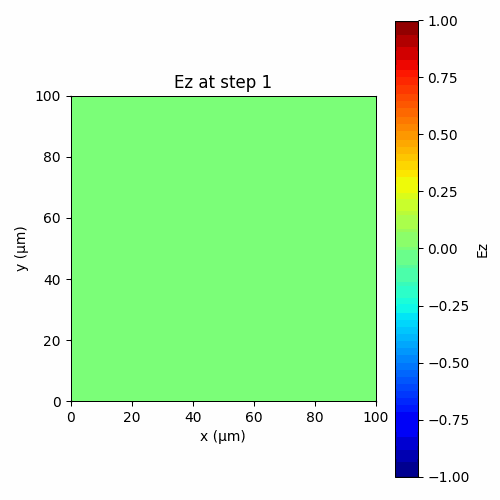

In [78]:
# In[4]: Save GIF to an in-memory buffer and display inline
import io
from IPython.display import Image as IPyImage, display

# write into a BytesIO buffer
buf = io.BytesIO()
frames_2[0].save(
    buf,
    format='GIF',
    append_images=frames_2[1:],
    save_all=True,
    duration=50,
    loop=1
)
buf.seek(0)  # rewind to start

# display directly from memory
display(IPyImage(data=buf.getvalue(), format='gif'))

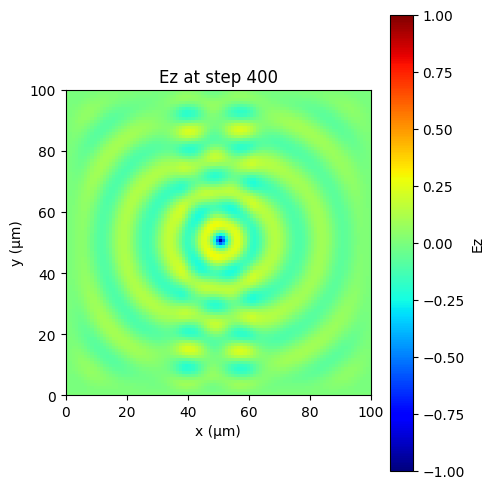

In [79]:
# Plot & capture
fig, ax = plt.subplots(figsize=(5,5))
im = ax.imshow(Ez.T, cmap='jet', vmin=-1, vmax=1,
                   origin='lower', extent=extent)
ax.set_title(f'Ez at step {n}')
ax.set_xlabel('x (μm)');  ax.set_ylabel('y (μm)')
fig.colorbar(im, ax=ax, label='Ez')
fig.tight_layout()


Here, we observed that the waves are absorbed by the boundaries due to the boundary conditions we set for the media. PML ensures that the electric field is nearly completely attenuated and does not get reflected.

# Gaussian pulse to find reflection coefficient

We can use a single pulse to find the magnitude of the incident wave and the reflected wave and calcuate the reflection coefficient through this analysis with PML boundaries

In [80]:
# Initialize fields
Ez = np.zeros((xdim, ydim))
Ezx = np.zeros_like(Ez)
Ezy = np.zeros_like(Ez)
Hy = np.zeros_like(Ez)
Hx = np.zeros_like(Ez)

# Material properties
epsilon = epsilon0 * np.ones_like(Ez)
# Insert a dielectric slab in the middle with eps_r = 2
epsilon[int(3*xsource/4):int(5*xsource/4), :] = 2 * epsilon0
mu = mu0 * np.ones_like(Ez)

# Conductivity arrays
sigmax = np.zeros_like(Ez)
sigmay = np.zeros_like(Ez)

# Compute sigma max
sigmamax = (-np.log10(refl_coeff)*(gradingorder+1)*epsilon0*c) / (2*bound_width*delta)
# Precompute boundary factors
bf1 = (1*sigmamax)/((bound_width**gradingorder)*(gradingorder+1))
bf2 = bf1
bf3 = bf1
bf4 = bf1

# Polynomial grading
x = np.arange(0, bound_width+1)
prev = np.concatenate(([0], x[:-1]))
poly = ( (x+0.5)**(gradingorder+1) - (prev+0.5)**(gradingorder+1) )

# Fill sigmax
for i in range(xdim):
  sigmax[i, bound_width::-1] = bf1*poly
  sigmax[i, -bound_width-1:] = bf2*poly
# Fill sigmay
for j in range(ydim):
  sigmay[bound_width::-1, j] = bf3*poly
  sigmay[-bound_width-1:, j] = bf4*poly

# Magnetic conductivity
sigma_starx = sigmax * mu / epsilon
sigma_stary = sigmay * mu / epsilon

# Precompute multipliers, both for x and y directions
G = (mu - 0.5*deltat*sigma_starx)/(mu + 0.5*deltat*sigma_starx)
H = (deltat/delta)/(mu + 0.5*deltat*sigma_starx)
A = (mu - 0.5*deltat*sigma_stary)/(mu + 0.5*deltat*sigma_stary)
B = (deltat/delta)/(mu + 0.5*deltat*sigma_stary)

C = (epsilon - 0.5*deltat*sigmax)/(epsilon + 0.5*deltat*sigmax)
D = (deltat/delta)/(epsilon + 0.5*deltat*sigmax)
E = (epsilon - 0.5*deltat*sigmay)/(epsilon + 0.5*deltat*sigmay)
F = (deltat/delta)/(epsilon + 0.5*deltat*sigmay)


probe_pos = int(xdim - 5)

E_ts  = []

# List to store animation frames
frames_2 = []
extent = [0, delta * xdim * 1e6, 0, delta * ydim * 1e6]

# Time-stepping loop
for n in range(1, time_tot+1):
  # Determine update region
  n1 = max(0, xsource-n)
  n2 = min(xdim-1, xsource+n)
  m1 = max(0, ysource-n)
  m2 = min(ydim-1, ysource+n)

  # Update H fields
  Hy[n1:n2, m1:m2] = ( A[n1:n2, m1:m2]*Hy[n1:n2, m1:m2]
            + B[n1:n2, m1:m2]*( (Ezx[n1+1:n2+1, m1:m2] - Ezx[n1:n2, m1:m2])
                              + (Ezy[n1+1:n2+1, m1:m2] - Ezy[n1:n2, m1:m2]) ) )
  Hx[n1:n2, m1:m2] = ( G[n1:n2, m1:m2]*Hx[n1:n2, m1:m2]
            - H[n1:n2, m1:m2]*( (Ezx[n1:n2, m1+1:m2+1] - Ezx[n1:n2, m1:m2])
                              + (Ezy[n1:n2, m1+1:m2+1] - Ezy[n1:n2, m1:m2]) ) )

  # Update E fields
  Ezx[n1+1:n2+1, m1+1:m2+1] = ( C[n1+1:n2+1, m1+1:m2+1]*Ezx[n1+1:n2+1, m1+1:m2+1]
            + D[n1+1:n2+1, m1+1:m2+1]*( -Hx[n1+1:n2+1, m1+1:m2+1] + Hx[n1+1:n2+1, m1:m2] ) )
  Ezy[n1+1:n2+1, m1+1:m2+1] = ( E[n1+1:n2+1, m1+1:m2+1]*Ezy[n1+1:n2+1, m1+1:m2+1]
            + F[n1+1:n2+1, m1+1:m2+1]*(  Hy[n1+1:n2+1, m1+1:m2+1] - Hy[n1:n2, m1+1:m2+1] ) )

    # Source injection

  if n < 10:
    Ezx[xsource, ysource] = 0.5
    Ezy[xsource, ysource] = 0.5
  else:
    Ezx[xsource, ysource] = 0.0
    Ezy[xsource, ysource] = 0.0

  Ez = Ezx + Ezy
  E_ts.append( Ez[probe_pos, ysource] )

First peak at index 76, time = 1.815e-13 s, amplitude = 5.208e-02


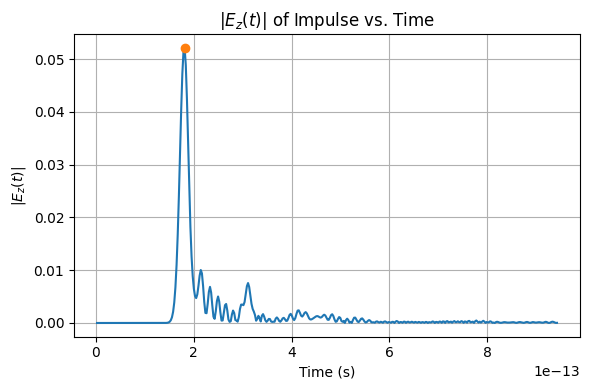

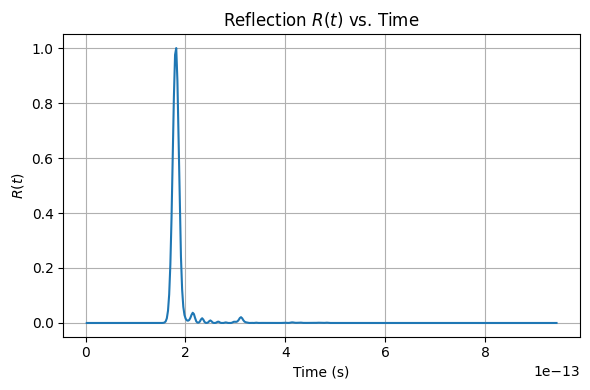

In [81]:
from scipy.signal import find_peaks

E_test  = np.array(E_ts)
t = np.arange(1, time_tot+1) * deltat

absE = np.abs(E_test)
peaks, _ = find_peaks(absE)

first_peak_idx = peaks[0]
first_peak_time  = t[first_peak_idx]
E_inc = absE[first_peak_idx]

print(f"First peak at index { first_peak_idx }, time = {first_peak_time:.3e} s, amplitude = {E_inc:.3e}")

# plot E
plt.figure(figsize=(6,4))
plt.plot(t, np.abs(E_test), lw=1.5)
plt.plot(first_peak_time, E_inc, 'o')
plt.xlabel('Time (s)')
plt.ylabel('$|E_z(t)|$')
plt.title('$|E_z(t)|$ of Impulse vs. Time')
plt.grid(True)
plt.tight_layout()
plt.show()

# plot R
R_t = (absE/E_inc)**2
plt.figure(figsize=(6,4))
plt.plot(t, R_t, lw=1.5)
plt.xlabel('Time (s)')
plt.ylabel('$R(t)$')
plt.title('Reflection $R(t)$ vs. Time')
plt.grid(True)
plt.tight_layout()
plt.show()



# DATA

Although this is purely simulated data, we treat the FDTD grid as our dataset, matching the data from the seminal Yee FDTD paper:  https://www.sciencedirect.com/science/article/pii/S0021999184711594

Domain geometry and resolution: We use a $200 ×\times 200$ uniform grid, which balances spatial resolution (1 $\mu$m per cell) against computational cost. A finer grid (smaller $\Delta$) improves accuracy but increases runtime as $O(N^2)$ per time step.

Temporal sampling: The simulation runs for $350$ time steps, each of duration $\Delta t = S·\Delta /c \approx 2.36$ fs with $S = 1/\sqrt{2}$. This resolves the $2\times 10^{13}$ Hz source period ($\approx 66$ fs) with about 28 samples per cycle, sufficient to capture waveform details without aliasing.

Source: Point sinusoidal source at grid center ($x, y = 100, 100$) with $f = 2 \times 10^{13}$ Hz emits at $f = 2 \times 10^{13}$ Hz. Choosing the center avoids corner‐induced artifacts and symmetrizes wavefront propagation.

Materials: The domain is mostly free space (\epsilon_0, \mu_0) except for the PML layers in the second implementation and the dielectric slab with $\epsilon_r = 2$. Conductivity profiles in PML are graded to achieve a target reflection coefficient of $10^{-1}$.

Data outputs: We store the $E_z$ field snapshots at each time step. These frames comprise our simulated dataset, enabling both qualitative visualization (animated GIFs) and quantitative analysis of reflection amplitudes at boundaries.

# Simulation Results
Both simulations use identical time step $\Delta t = S \Delta / c$ with $S = 1/\sqrt{2}$. The PML uses a 25‐cell wide graded layer of order 6 targeting $R = 10^{-6}$.

PEC boundary results:

Field snapshots show outgoing wavefronts reflect entirely at all four edges.

Reflection factor: measuring Ez amplitude at middle of boundary yields $|R| \approx 1.0$ for first incidence.

Standing‐wave patterns form quickly, leading to spatial interference and energy recirculation in the domain.

PML boundary results:

Outgoing wavefronts enter the absorbing layer and decay exponentially.

Measured reflection coefficient at the PML interface is below 10⁻⁶, consistent with design.

No visible back-reflected wavefronts in the first 350 steps; residual field in PML region falls to machine precision.

Inline GIFs show Ez evolution. The PEC case exhibits strong reflections at boundaries, whereas the PML case absorbs outgoing waves with negligible reflection.

(GIFs rendered inline in the notebook)

# COMPARISONS
Reflection at boundaries: PEC reflects nearly 100% of outgoing energy, leading to standing-wave patterns. PML attenuates >99.9999% per pass, effectively simulating open space.

Computational cost: PML adds overhead in conductivity arrays and split-field storage but remains  per time step.

Implications: Graded PMLs enable realistic, low-reflection FDTD simulations essential for photonics and antenna modeling.

# CONCLUSION

We implemented and compared PEC and graded PML boundary conditions for 2D TM FDTD simulations. The PML drastically reduces non-physical reflections, at modest computational cost. Future work could explore convolutional PML, higher dimensions, or dispersive materials.

# References

K. S. Yee, "Numerical solution of initial boundary value problems involving Maxwell's equations in isotropic media," IEEE Transactions on Antennas and Propagation, vol. AP14, pp. 302-307, 1966. DOI: 10.1109/TAP.1966.1138693 1

J.-P. Berenger, “A perfectly matched layer for the absorption of electromagnetic waves,” J. Comput. Phys., 114 (2), 185 –200 (1994). https://doi.org/10.1006/jcph.1994.1159 0021-9991 Google Scholar

Taflove, A., & Hagness, S. C. (2005). Computational Electrodynamics: The Finite-Difference Time-Domain Method. (3rd ed.) Artech House.

S. D. Gedney, "An anisotropic perfectly matched layer-absorbing medium for the truncation of FDTD lattices", IEEE Trans. Antennas Propag., vol. 44, no. 12, pp. 1630-1639, Dec. 1996.

Computational Electromagnetics At IIT Madras (2025). 2D FDTD of a region with Perfect Electric Conductor boundary (https://www.mathworks.com/matlabcentral/fileexchange/35576-2d-fdtd-of-a-region-with-perfect-electric-conductor-boundary), MATLAB Central File Exchange. Retrieved April 28, 2025.

Sougata Chatterjee (2025). Perfectly Matched Layer(PML) in FDTD method. (https://www.mathworks.com/matlabcentral/fileexchange/30596-perfectly-matched-layer-pml-in-fdtd-method), MATLAB Central File Exchange. Retrieved April 28, 2025.